In [1]:
import cv2
import numpy as np
import glob
##import images
# images_folder = "05-28-2026_Images"
# images_folder = "Air_Calib"
images_folder = "05-28-2026_v2"
images = glob.glob(images_folder + "/*.JPG")

##debug
print(f"Found {len(images)} images in the folder.")

##opencv needed parameters
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.
i=1

##run through all the images in the folder
for image_path in images:

    print(f"Processing {i}/{len(images)}: {image_path}")
    # Read the image
    image = cv2.imread(image_path)
    image = cv2.resize(image, (0, 0), fx=0.15, fy=0.15)  # half resolution
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)

    #if corners
    if ret == True:
        objp = np.zeros((9*6, 3), np.float32)
        objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)

        imgpoints.append(corners)
        objpoints.append(objp)
        print(f"Chessboard corners found in image: {image_path}, Count: {i}/22")
    i += 1

#perform camera calibration
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)


Found 22 images in the folder.
Processing 1/22: 05-28-2026_v2/DSCF7139.JPG
Chessboard corners found in image: 05-28-2026_v2/DSCF7139.JPG, Count: 1/22
Processing 2/22: 05-28-2026_v2/DSCF7138.JPG
Chessboard corners found in image: 05-28-2026_v2/DSCF7138.JPG, Count: 2/22
Processing 3/22: 05-28-2026_v2/DSCF7117.JPG
Chessboard corners found in image: 05-28-2026_v2/DSCF7117.JPG, Count: 3/22
Processing 4/22: 05-28-2026_v2/DSCF7116.JPG
Chessboard corners found in image: 05-28-2026_v2/DSCF7116.JPG, Count: 4/22
Processing 5/22: 05-28-2026_v2/DSCF7128.JPG
Chessboard corners found in image: 05-28-2026_v2/DSCF7128.JPG, Count: 5/22
Processing 6/22: 05-28-2026_v2/DSCF7115.JPG
Chessboard corners found in image: 05-28-2026_v2/DSCF7115.JPG, Count: 6/22
Processing 7/22: 05-28-2026_v2/DSCF7129.JPG
Chessboard corners found in image: 05-28-2026_v2/DSCF7129.JPG, Count: 7/22
Processing 8/22: 05-28-2026_v2/DSCF7130.JPG
Processing 9/22: 05-28-2026_v2/DSCF7118.JPG
Processing 10/22: 05-28-2026_v2/DSCF7119.JPG
Che

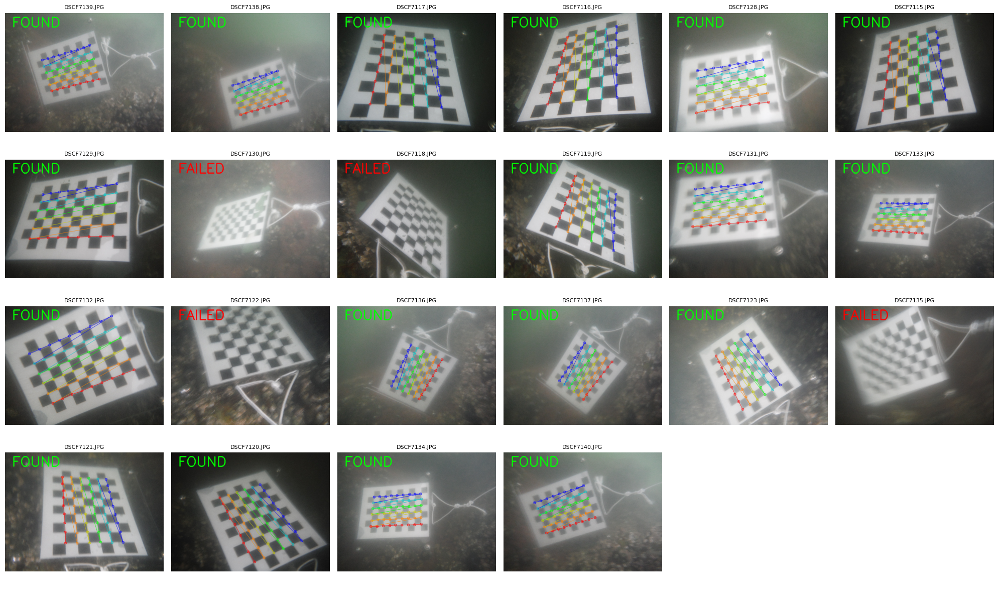

In [2]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(4, 6, figsize=(20, 12))  # adjust grid to fit 22 images
axes = axes.flatten()

for idx, image_path in enumerate(images):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (0, 0), fx=0.15, fy=0.15)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)
    
    cv2.drawChessboardCorners(image, (9, 6), corners, ret)
    label = "FOUND" if ret else "FAILED"
    color = (0, 255, 0) if ret else (0, 0, 255)
    cv2.putText(image, label, (30, 60), cv2.FONT_HERSHEY_SIMPLEX, 2, color, 3)
    
    # cv2 loads BGR, matplotlib expects RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    axes[idx].imshow(image_rgb)
    axes[idx].set_title(image_path.split("/")[-1], fontsize=8)
    axes[idx].axis("off")

# Hide any unused subplots
for idx in range(len(images), len(axes)):
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

Camera Matrix:
 [[799.00364825   0.         351.8430829 ]
 [  0.         801.14997434 217.5447831 ]
 [  0.           0.           1.        ]]

Distortion Coefficients:
 [[ 0.27412818  0.40913805 -0.02765437  0.0038976  -2.35122919]]


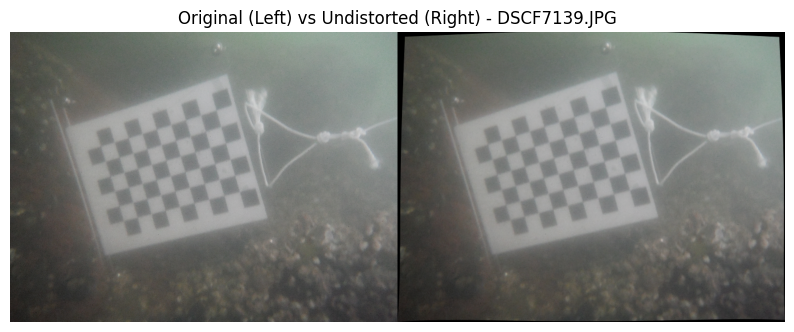

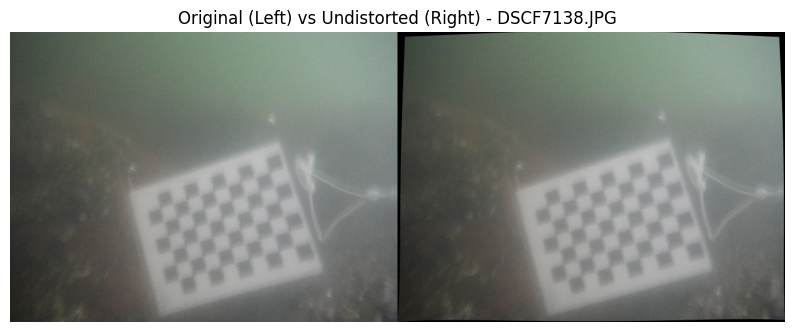

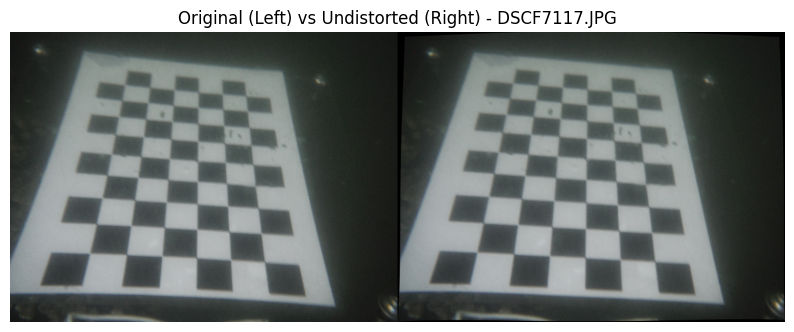

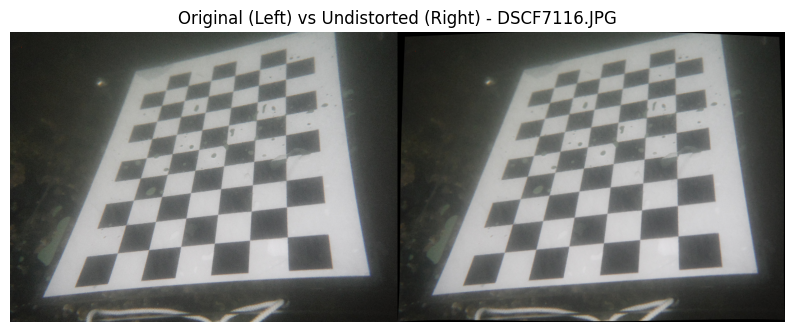

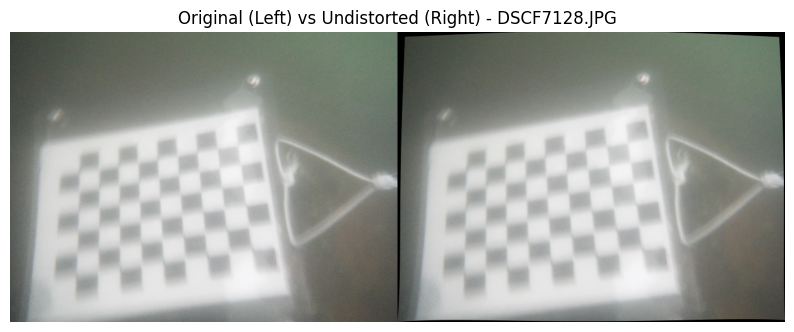

...

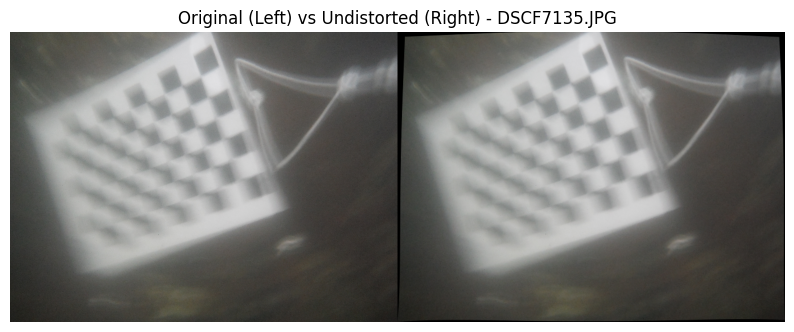

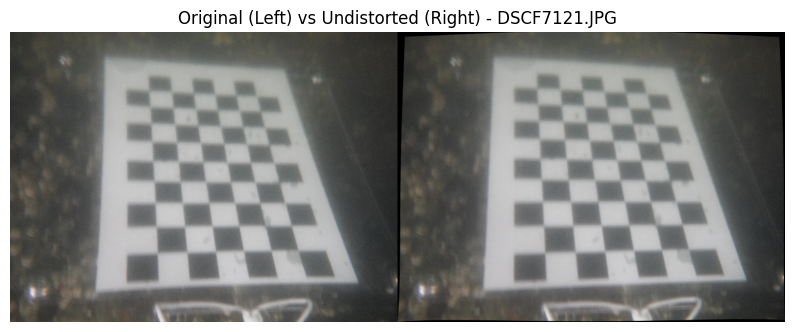

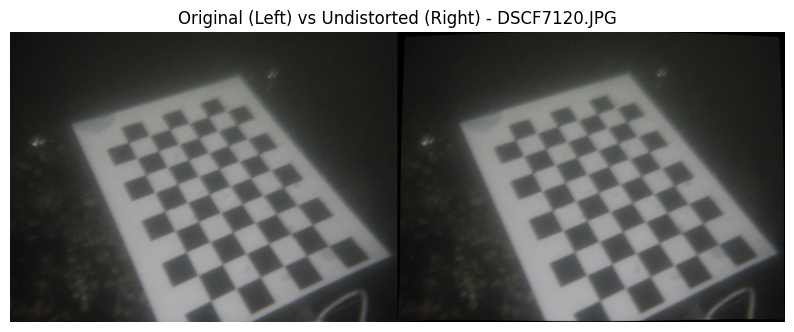

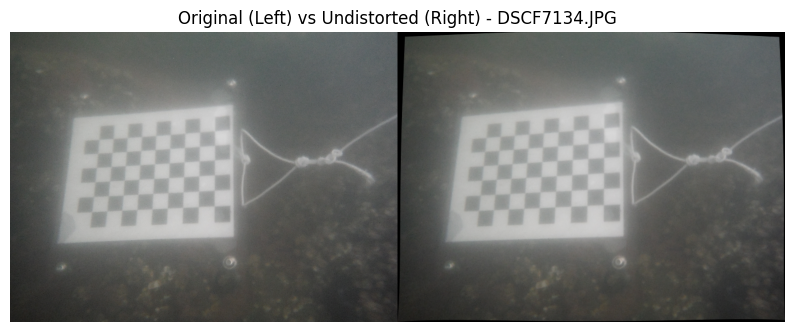

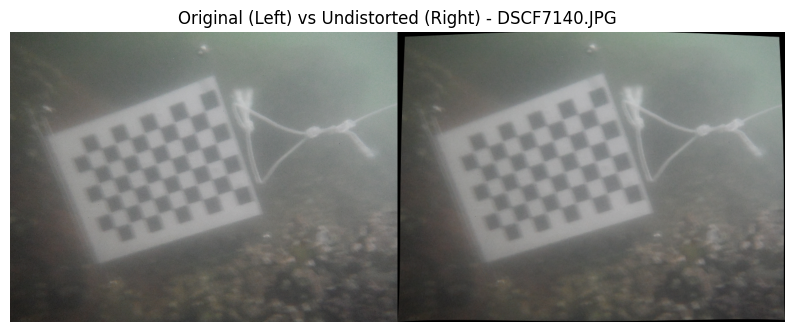

In [3]:
##show the camera matrix and distortion coefficients
print("Camera Matrix:\n", mtx)
print("\nDistortion Coefficients:\n", dist)

##show undistorted and distored images side by side
for idx, image_path in enumerate(images):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (0, 0), fx=0.15, fy=0.15)
    h, w = image.shape[:2]
    newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))
    
    undistorted = cv2.undistort(image, mtx, dist, None, newcameramtx)
    
    combined = np.hstack((image, undistorted))
    
    plt.figure(figsize=(10, 5))
    plt.imshow(cv2.cvtColor(combined, cv2.COLOR_BGR2RGB))
    plt.title(f"Original (Left) vs Undistorted (Right) - {image_path.split('/')[-1]}")
    plt.axis("off")
    plt.show()